## ALICE Computer Vision Scrapbook

Trying out a random selection of basic computer vision tools on ALICE training data.

__Main Aim__: find pin or approximate label/pin region with edge detection / thresholding tools.

Currently four sections:

1. Basic Tests - random binarization / edge detection methods.
1. Binarization Misc - analysing effects of smoothing image before Otsu binarization.
1. Approximating Regions - using ellipses (or modified ellipses) to approximate region of labels + pin.
1. Approximating Pin Location - using the mode colour within an approximated pin contour, to locate a pin an image.

#### Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy
import pandas as pd
import os
import tqdm
import re
import random
import statistics as stats
from skimage import io, measure
from skimage.filters import gaussian, threshold_otsu
from skimage.segmentation import active_contour
from skimage.feature import canny
import cv2
from scipy import ndimage as ndi
from skimage.segmentation import flood, flood_fill

%matplotlib inline

## 1) Basic Tests

TL;DR - Otsu thresholding and Marching Squares to find the contours that are most likely to contain the pin. Function finds all contours and filters for the _skinniest_ ones, i.e., those with the highest _pinch_ score: <code> max(y)-min(y)/(max(x)-min(x))</code>. Okay -- not great.

#### Sample Data:

In [2]:
pth = "Data//Images//train//013612467_additional_3.JPG"

img = io.imread(pth)

img_bw = io.imread(pth,as_gray=True)

### Marching Squares

In [113]:
thresh = threshold_otsu(img_bw)
binary = img_bw > thresh

contours = measure.find_contours(binary, 0.8)

(-0.5, 5999.5, 3999.5, -0.5)

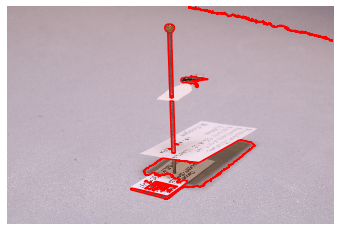

In [114]:
fig,ax = plt.subplots()
ax.imshow(img)

# Find length (no. coordinates) of all contours:
lens = [len(c[:,0]) for c in contours]
# Set lower bound for length:
lb = np.floor(np.average(lens))
# Create subset based on lower bound:
inds = np.where(np.array(lens)>=lb)[0]
# Find the y range of the contours:
y_ranges = [np.round((max(c[:,0])-min(c[:,0])),4) for c in contours]
# Filter for those with top k ranges:
k = 10
top_inds = np.argsort(np.array(y_ranges)[inds])[-k:]
top_inds = inds[top_inds]

for i in top_inds:
    c = contours[i]
    ax.plot(c[:,1],c[:,0],'-r')
    
ax.axis('off')

### Binarization

In [99]:
img_gaussian = gaussian(img_bw,3)

thresh = threshold_otsu(img_bw)
bin_otsu1 = img_bw > thresh

thresh = threshold_otsu(img_gaussian)
bin_otsu2 = img_gaussian > thresh

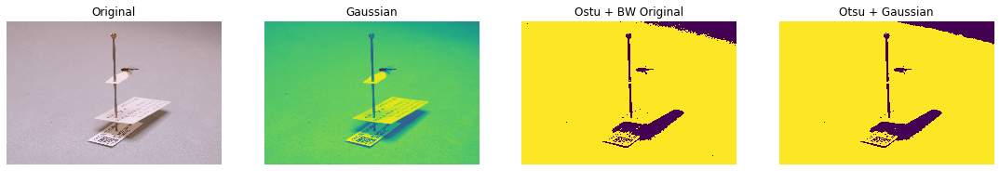

In [110]:
fig,ax = plt.subplots(1,4,figsize=(19,7))

ax[0].imshow(img)
ax[1].imshow(img_gaussian)
ax[2].imshow(bin_otsu1)
ax[3].imshow(bin_otsu2)

labels = ['Original','Gaussian','Ostu + BW Original','Otsu + Gaussian']
for i,title in enumerate(labels):
    ax[i].axis('off')
    ax[i].set_title(title)

### Test: Single Pin Finding

(-0.5, 5999.5, 3999.5, -0.5)

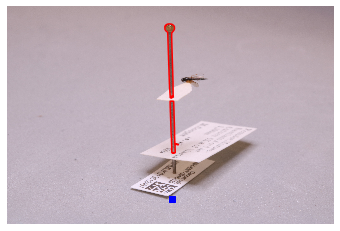

In [141]:
thresh = threshold_otsu(img_bw)
binary = img_bw > thresh

contours = measure.find_contours(bin_otsu2, 0.8)

fig,ax = plt.subplots()
ax.imshow(img)

# Find length (no. coordinates) of all contours:
lens = [len(c[:,0]) for c in contours]
# Set lower bound for length:
lb = np.floor(np.average(lens))
# Create subset based on lower bound:
inds = np.where(np.array(lens)>=lb)[0]
# Find the y range of the contours:
y_ranges = [np.round((max(c[:,0])-min(c[:,0])),4) for c in contours]
# Filter for those with top k ranges:
k = 10
top_inds = np.argsort(np.array(y_ranges)[inds])[-k:]
top_inds = inds[top_inds]

pinch = []

min_yvalues = []

for i in top_inds:
    c = contours[i]
    x = c[:,1]
    y = c[:,0]
    p = (max(y)-min(y))/(max(x)-min(x))
    p = np.round(p,3)
    pinch.append(p)
    min_yvalues.append(max(y)) # Since the photos, using io, are upsite down.

pin_inds = top_inds[np.where(np.array(pinch)>=np.average(pinch))[0]]

pin_contours = []

for i in pin_inds:
    c = contours[i]
    pin_contours.append([c[:,1],c[:,0]])
    ax.plot(c[:,1],c[:,0],'-r')
    
mid = np.average([np.average(p_contour[0]) for p_contour in pin_contours])
ax.plot(mid,max(min_yvalues),'bs')
    
ax.axis('off')

### Automated Tests

#### Function

In [2]:
def find_pin_contours(img,k=10):
    # Input: a greyscaled image.
    
    # 1) Threshold image:
    img_gaussian = gaussian(img,3)
    thresh = threshold_otsu(img_gaussian)
    binary = img_gaussian > thresh
    
    # 2) Find all contours:
    contours = measure.find_contours(binary, 0.8)
    
    # 3) Filter for "top" contours:
    # Find length (no. coordinates) of all contours:
    lens = [len(c[:,0]) for c in contours]
    # Set lower bound for length:
    lb = np.floor(np.average(lens))
    # Create subset based on lower bound:
    inds = np.where(np.array(lens)>=lb)[0]
    # Find the y range of the contours:
    y_ranges = [np.round((max(c[:,0])-min(c[:,0])),4) for c in contours]
    # Filter for those with top k ranges:
    top_inds = np.argsort(np.array(y_ranges)[inds])[-k:]
    top_inds = inds[top_inds]
    
    # 4) Find pin contours:
    pinch = []
    min_yvalues = []

    for i in top_inds:
        c = contours[i]
        x = c[:,1]
        y = c[:,0]
        p = (max(y)-min(y))/(max(x)-min(x))
        p = np.round(p,3)
        pinch.append(p)
        min_yvalues.append(max(y)) # Since the photos, using io, are upsite down.

    pin_inds = top_inds[np.where(np.array(pinch)>=np.average(pinch))[0]]

    pin_contours = []

    for i in pin_inds:
        c = contours[i]
        pin_contours.append([c[:,1],c[:,0]])
        
    # 5) Approximate pin base:
    base_x = np.average([np.average(p_contour[0]) for p_contour in pin_contours])
    base_y = max(min_yvalues)
    
    return pin_contours, np.round([base_x,base_y],4)

#### Sample

In [14]:
filenames1 = []
filenames2 = []

for file in os.listdir("Data//Images//train"):
    if "json" not in file:
        filenames1.append("Data//Images//train//"+file)
    
    
for file in os.listdir("Data//Images//val"):
    if "json" not in file:
        filenames2.append("Data//Images//val//"+file)
    
all_filenames = filenames1+filenames2

In [15]:
sample_filenames = random.sample(all_filenames,25)

#### Tests

In [161]:
img = io.imread(sample_filenames[0])
img_bw = io.imread(sample_filenames[0],as_gray=True)

In [166]:
pin_contours, base_point =  find_pin_contours(img_bw)

In [176]:
all_details = []

for filepath in tqdm.tqdm(sample_filenames):
    # Load image:
    img_bw = io.imread(filepath,as_gray=True)
    # Find contours:
    pin_contours, base_point =  find_pin_contours(img_bw)
    # Save:
    all_details.append([pin_contours,base_point])

100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:40<00:00,  4.00s/it]


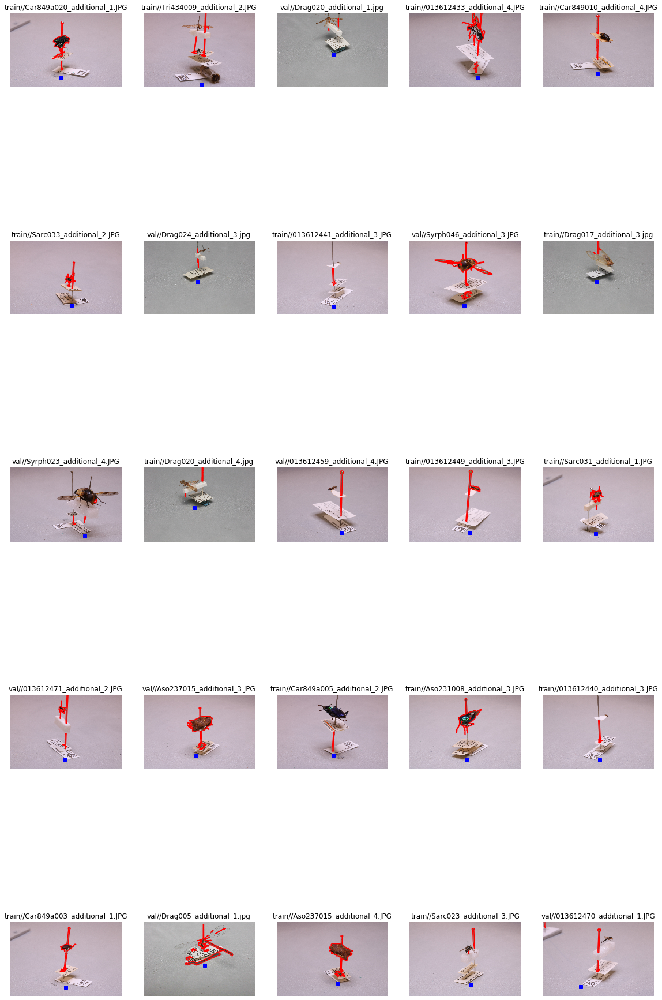

In [177]:
fig,ax = plt.subplots(5,5,figsize=(20,35))

j = 0

for u,filepath in enumerate(sample_filenames):
    i = u%5
    # Load image:
    img = io.imread(filepath)
    # Get contour information:
    pin_contours, base_point = all_details[u]
    # Plot image and contours:
    ax[i,j].imshow(img)
    for pc in pin_contours:
        ax[i,j].plot(pc[0],pc[1],'-r')
    ax[i,j].plot(base_point[0],base_point[1],'bs')
    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:])
    
    if i == 4:
        j = j+1
    
plt.savefig('pin_contours_test.pdf',dpi=600,bbox_inches='tight',pad_inches=0.35)

## 2) Binarization Misc

TL;DR - Effects of modifying an image before binarization with Otsu. Gaussian blur (cv2) works the best.

In [5]:
def otsu_binarize(img,modify=True,k=50):
    
    if modify == True:
        mx = 1
        if np.max(img) > 2:
            mx = 255
        image = deepcopy(img)
        image[:k,:] = mx
        image[-k:,:] = mx
        image[:,:k] = mx
        image[:,-k:] = mx
    else:
        image = img

    thresh = threshold_otsu(image)
    binary = image > thresh
    return binary

In [242]:
# Original image:
pth = sample_filenames[11]
img = io.imread(pth)

# Grey-scale image:
img_bw = io.imread(pth,as_gray=True)
img_gaussian = gaussian(img_bw,8)
img_bw2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
blurred = cv2.GaussianBlur(img_bw2, (5, 5), 0)

# Threshold greyscaled image:
otsu_bin1 = otsu_binarize(img_bw)
otsu_bin2 = otsu_binarize(img_gaussian)
otsu_bin3 = otsu_binarize(blurred)

# Contour example:
contours = measure.find_contours(otsu_bin1, 0.8)

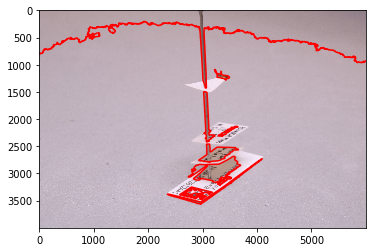

In [184]:
fig,ax = plt.subplots()
ax.imshow(img)

# Find length (no. coordinates) of all contours:
lens = [len(c[:,0]) for c in contours]
# Set lower bound for length:
lb = np.floor(np.average(lens))
# Create subset based on lower bound:
inds = np.where(np.array(lens)>=lb)[0]
# Find the y range of the contours:
y_ranges = [np.round((max(c[:,0])-min(c[:,0])),4) for c in contours]
# Filter for those with top k ranges:
k = 10
top_inds = np.argsort(np.array(y_ranges)[inds])[-k:]
top_inds = inds[top_inds]

for ind in top_inds:
    c = contours[ind]
    ax.plot(c[:,1],c[:,0],'-r')

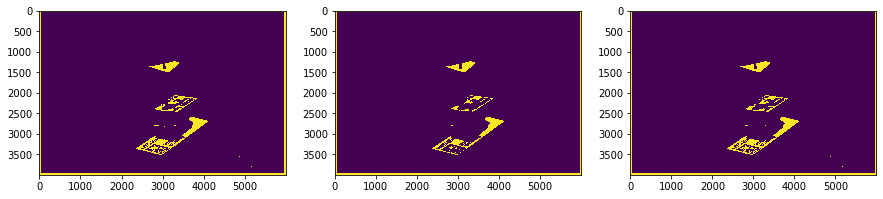

In [243]:
fig,ax = plt.subplots(1,3,figsize=(15,7))

ax[0].imshow(otsu_bin1)
ax[1].imshow(otsu_bin2)
ax[2].imshow(otsu_bin3)

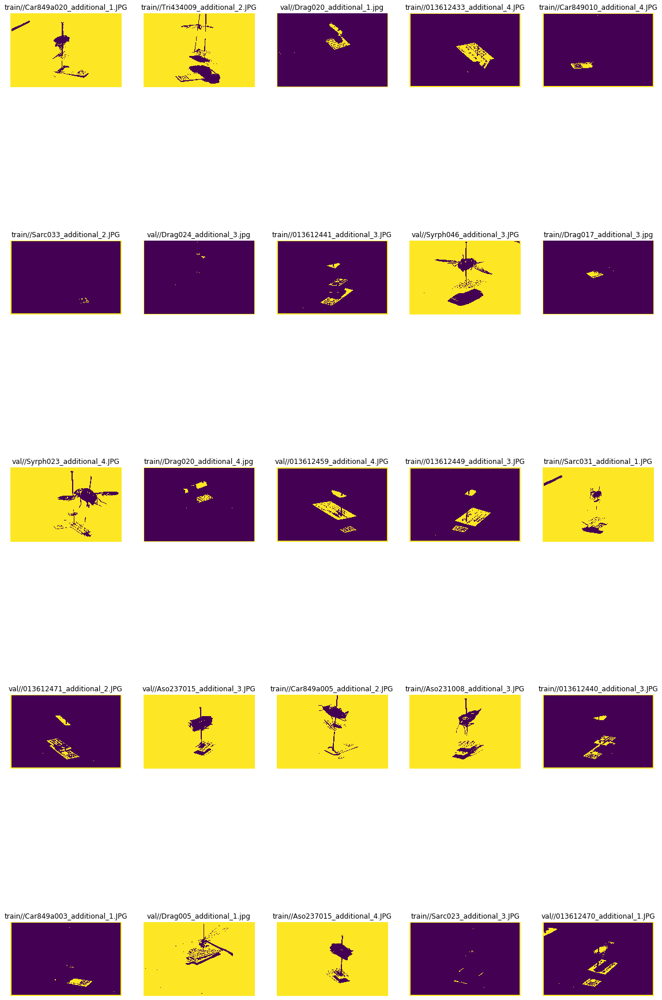

In [244]:
fig,ax = plt.subplots(5,5,figsize=(20,35))

j = 0

for u,filepath in enumerate(sample_filenames):
    i = u%5
    # Load image:
    img = io.imread(filepath)
    # Threshold:
    img_bw = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    blurred = cv2.GaussianBlur(img_bw, (5, 5), 0)
    otsu_bin = otsu_binarize(blurred)
    # Plot binarized image:
    ax[i,j].imshow(otsu_bin)
    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:])
    
    if i == 4:
        j = j+1
    
plt.savefig('binarization_test.pdf',dpi=600,bbox_inches='tight',pad_inches=0.35)

In [6]:
def prop_black(img):
    w = len(np.where(img==True)[0])
    b = len(np.where(img==False)[0])
    p = b/(w+b)
    return np.round(p,5)

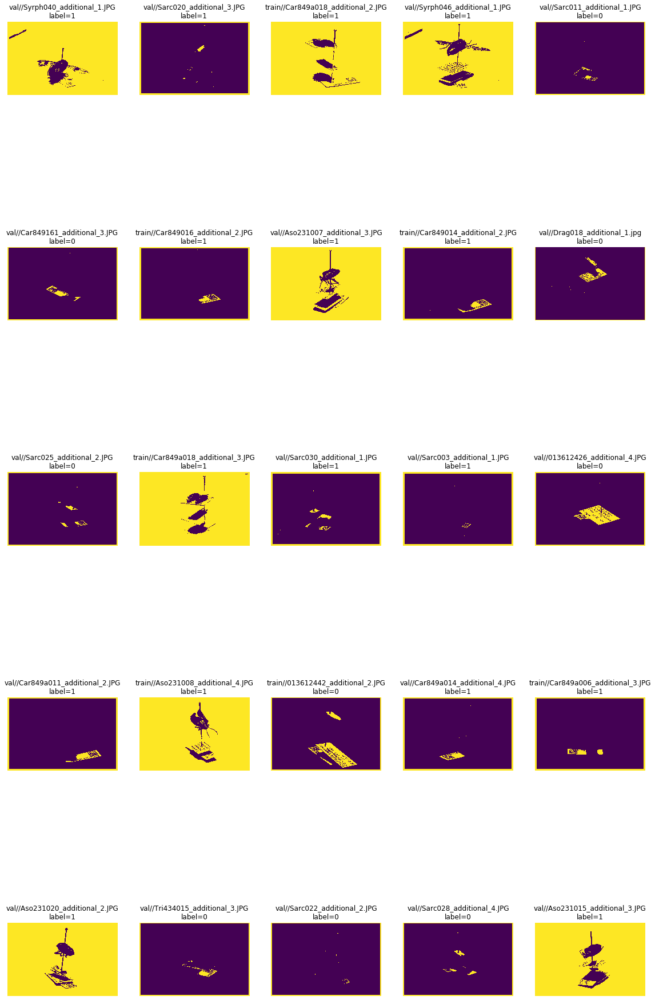

In [26]:
fig,ax = plt.subplots(5,5,figsize=(20,35))

j = 0

for u,filepath in enumerate(sample_filenames):
    i = u%5
    # Load image:
    img = io.imread(filepath)
    # Threshold:
    img_bw = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    blurred = cv2.GaussianBlur(img_bw, (5, 5), 0)
    otsu_bin = otsu_binarize(blurred)
    p = prop_black(otsu_bin)
    label = 0
    if p < 0.3:
        otsu_bin = otsu_binarize(blurred,k=100)
        label = 1

    # Plot binarized image:
    ax[i,j].imshow(otsu_bin)
    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:]+'\nlabel='+str(label))
    
    if i == 4:
        j = j+1
    
plt.savefig('binarization_test2.pdf',dpi=600,bbox_inches='tight',pad_inches=0.35)

## 3) Approximating Regions

TL;DR -- Using the _single pin finding_ code from before, approximate the region where the labels lie with an ellipse.

__Note__: Moved some code into _boundary_approximation.py_ to try and keep it more organised.

In [3]:
def get_ellipse(mpx, mpy, diamx, diamy):

    # Denote radius.
    a = diamx / 2  # radius on the x-axis
    b = diamy / 2  # radius on the y-axis

    # Define t.
    t = np.linspace(0, 2 * np.pi, 100)

    # Compute ellipse.
    x = mpx + (a * np.cos(t))
    y = mpy + (b * np.sin(t))

    return x, y

In [8]:
img_bw = io.imread(sample_filenames[0],as_gray=True)
pin_contours, base_point =  find_pin_contours(img_bw)

In [9]:
mn = min([min(p[1]) for p in pin_contours])
diamy = base_point[1] - mn
diamx = max([max(p[0]) for p in pin_contours]) - min([min(p[0]) for p in pin_contours])
mpy = mn + (diamy/2)

xe,ye = get_ellipse(base_point[0], mpy, diamx*2.5, diamy)

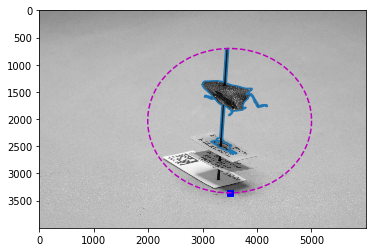

In [10]:
fig,ax = plt.subplots()
ax.imshow(img_bw,cmap='gray')
for p in pin_contours:
    ax.plot(p[0],p[1])
    
ax.plot(base_point[0],base_point[1],'bs')

ax.plot(xe,ye,'--m')

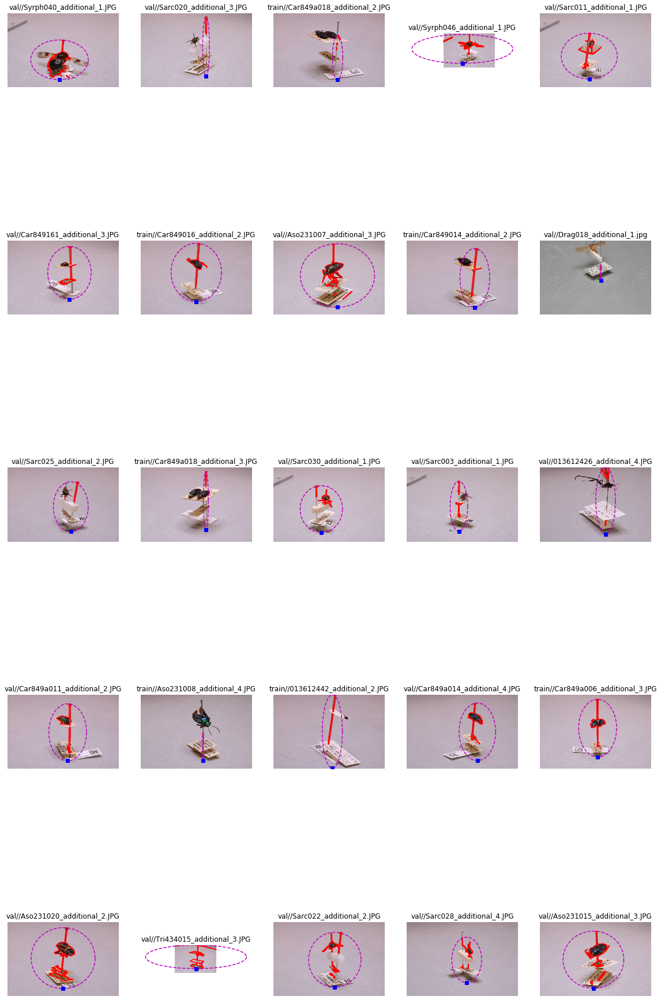

In [72]:
fig,ax = plt.subplots(5,5,figsize=(20,35))

j = 0

for u,filepath in enumerate(sample_filenames):
    i = u%5
    # Load image:
    img = io.imread(filepath)
    img_bw = io.imread(filepath,as_gray=True)
    # Find contours:
    pin_contours, base_point =  find_pin_contours(img_bw)
    # Plot image and contours:
    ax[i,j].imshow(img)
    for pc in pin_contours:
        ax[i,j].plot(pc[0],pc[1],'-r')
    # Ellipse info:
    mn = min([min(p[1]) for p in pin_contours])
    diamy = base_point[1] - mn
    diamx = max([max(p[0]) for p in pin_contours]) - min([min(p[0]) for p in pin_contours])
    mpy = mn + (diamy/2)
    
    # Plot ellipse:
    xe,ye = get_ellipse(base_point[0], mpy, diamx*2.5, diamy)
    if (xe.any()<0) or (ye.any()<0):
        xe,ye = get_ellipse(base_point[0], mpy, diamx*1.15, diamy)
    ax[i,j].plot(xe,ye,'--m')
    ax[i,j].plot(base_point[0],base_point[1],'bs')
    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:])
    
    if i == 4:
        j = j+1
    
plt.savefig('region_test.pdf',dpi=600,bbox_inches='tight',pad_inches=0.35)

In [11]:
def find_top_contours(img,k=10):
    # Input: a greyscaled image.
    
    # 1) Threshold image:
    img_gaussian = gaussian(img,3)
    thresh = threshold_otsu(img_gaussian)
    binary = img_gaussian > thresh
    
    # 2) Find all contours:
    contours = measure.find_contours(binary, 0.8)
    
    # 3) Filter for "top" contours:
    # Find length (no. coordinates) of all contours:
    lens = [len(c[:,0]) for c in contours]
    # Set lower bound for length:
    lb = np.floor(np.average(lens))
    # Create subset based on lower bound:
    inds = np.where(np.array(lens)>=lb)[0]
    # Find the y range of the contours:
    y_ranges = [np.round((max(c[:,0])-min(c[:,0])),4) for c in contours]
    # Filter for those with top k ranges:
    top_inds = np.argsort(np.array(y_ranges)[inds])[-k:]
    top_inds = inds[top_inds]
    
    top_contours = []

    for i in top_inds:
        c = contours[i]
        top_contours.append([c[:,1],c[:,0]])
       
    return top_contours

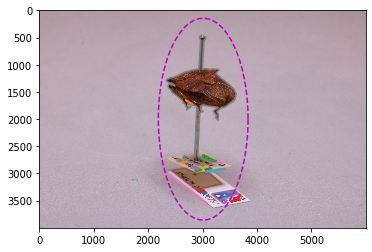

In [20]:
img = io.imread(sample_filenames[1])
img_bw = io.imread(sample_filenames[1],as_gray=True)
top_contours = find_top_contours(img_bw,k=20)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

fig,ax = plt.subplots()
ax.imshow(img)
for p in top_contours:
    ax.plot(p[0],p[1])
    
mn = min([min(p[1]) for p in pin_contours])
diamy = base_point[1] - mn
diamx = max([max(p[0]) for p in pin_contours]) - min([min(p[0]) for p in pin_contours])
mpy = mn + (diamy/2)
    
xe,ye = get_ellipse(base_point[0], mpy, diamx*1.2, diamy*1.2)

ax.plot(xe,ye,'--m')

In [4]:
def in_ellipse(xpoint, ypoint, xc, yc, dx, dy):

    # Denote radius.
    rx = dx / 2
    ry = dy / 2

    # Compute ellipse interval.
    a = ((xpoint - xc) / rx) ** 2
    b = ((ypoint - yc) / ry) ** 2

    # Decide if point is in ellipse.
    inEllipse = False
    if a + b <= 1:
        inEllipse = True

    return inEllipse

In [28]:
top_contours = find_top_contours(img_bw,k=20)

In [29]:
in_boundary = [(np.array([in_ellipse(c[0][i],c[1][i],base_point[0], mpy, diamx*1.2, diamy*1.2) for i in range(0,len(c[0]))]).any() == True) for c in top_contours]

(-0.5, 5999.5, 3999.5, -0.5)

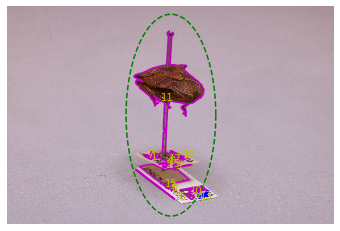

In [22]:
fig,ax = plt.subplots()
ax.imshow(img)

for u,c in enumerate(top_contours):
    col = '-m'
    if in_boundary[u] == False:
        col = '-b'
    ax.plot(c[0],c[1],col)
    ax.text(c[0][0],c[1][0],str(u),color='y')
    
xe_,ye_ = get_ellipse(base_point[0], mpy, diamx*1.2, diamy*1.2)

ax.plot(xe_,ye_,'--g')

ax.axis('off')

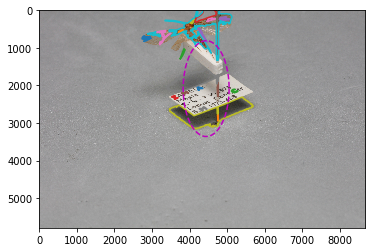

In [27]:
img = io.imread(pth)
img_bw = io.imread(pth,as_gray=True)
top_contours = find_top_contours(img_bw,k=20)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

fig,ax = plt.subplots()
ax.imshow(img)
for p in top_contours:
    ax.plot(p[0],p[1])
    
mn = min([min(p[1]) for p in pin_contours])
diamy = base_point[1] - mn
diamx = max([max(p[0]) for p in pin_contours]) - min([min(p[0]) for p in pin_contours])
mpy = mn + (diamy/2)
    
xe,ye = get_ellipse(base_point[0], mpy, diamx*1.2, diamy*1.2)

ax.plot(xe,ye,'--m')

v:11


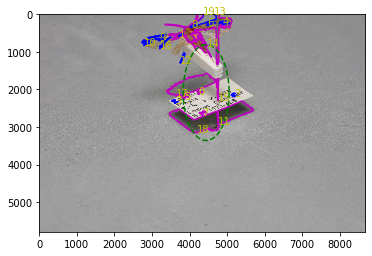

In [43]:
fig,ax = plt.subplots()
ax.imshow(img)

v = 0

for u,c in enumerate(top_contours):
    col = '-m'
    if in_boundary[u] == False:
        col = '-b'
        v = v+1
    ax.plot(c[0],c[1],col)
    ax.text(c[0][0],c[1][0],str(u),color='y')
    
xe_,ye_ = get_ellipse(base_point[0], mpy, diamx*1.2, diamy*1.2)

ax.plot(xe_,ye_,'--g')

print("v:"+str(v))

#ax.axis('off')

In [37]:
from boundary_approximation import approximate_region

In [150]:
filt_contours, ellipse, boundary = approximate_region(pth)

C:\Users\arian\Documents\GitHub\ALICE\boundary_approximation.py:65: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  pin_contours = np.array(contours)[pin_inds]


In [151]:
img = io.imread(pth)

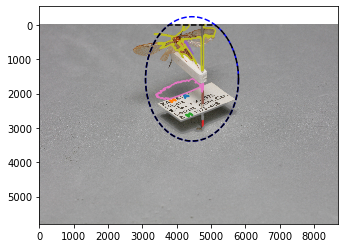

In [152]:
fig,ax = plt.subplots()
ax.imshow(img)
for xy in filtered_contours:
    ax.plot(xy[0],xy[1])
    
ax.plot(ellipse[0],ellipse[1],'--b')
ax.plot(boundary[0],boundary[1],'--k')

In [44]:
filtered_contours = np.array(top_contours,dtype='object')[in_boundary]

In [67]:
range_x = [[min(xy[0]),max(xy[0])] for xy in filtered_contours]

In [131]:
xdiam = np.max(range_x)-np.min(range_x)

In [77]:
range_y = [[min(xy[1]),max(xy[1])] for xy in filtered_contours]

In [132]:
ydiam = np.max(range_y)-np.min(range_y)

In [128]:
mn_y = min([min(xy[1][np.where((xy[0]<max(xe)) & (xy[0]>min(xe)))[0]]) for xy in filtered_contours])

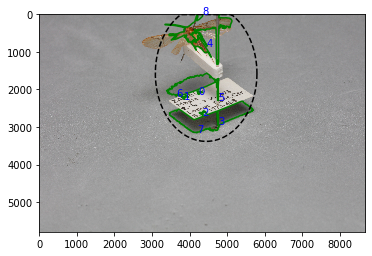

In [148]:
fig,ax = plt.subplots()

ax.imshow(img)

for u,xy in enumerate(filtered_contours):
    ax.plot(xy[0],xy[1],'-g')
    ax.text(xy[0][0],xy[1][0],str(u),color='b')
    
    
xe_,ye_ = get_ellipse(base_point[0], (mn_y+base_point[1])/2, xdiam*1.15, ydiam*1.15)

boundx = [min(max(x,5),np.shape(img)[1]-5) for x in xe_]

boundy = [min(max(y,5),np.shape(img)[0]-5) for y in ye_]

ax.plot(boundx,boundy,'--k')

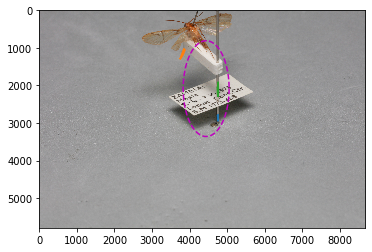

In [10]:
img = io.imread(pth)
img_bw = io.imread(pth,as_gray=True)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

fig,ax = plt.subplots()
ax.imshow(img)
for p in pin_contours:
    ax.plot(p[0],p[1])
    
mn = min([min(p[1]) for p in pin_contours])
diamy = base_point[1] - mn
diamx = max([max(p[0]) for p in pin_contours]) - min([min(p[0]) for p in pin_contours])
mpy = mn + (diamy/2)
    
xe,ye = get_ellipse(base_point[0], mpy, diamx*1.2, diamy*1.2)

ax.plot(xe,ye,'--m')    

In [12]:
in_boundary = [
        (
            np.array(
                [
                    in_ellipse(
                        c[0][i],
                        c[1][i],
                        base_point[0],
                        mpy,
                        diamx*1.2,
                        diamy*1.2,
                    )
                    for i in range(0, len(c[0]))
                ]
            ).any()
            == True
        )
        for c in pin_contours
    ]
filtered_contours = np.array(pin_contours, dtype="object")[in_boundary]

In [7]:
def filter_pin_contours(pin_contours,ellipse_info,proportion=0.5):

    in_boundary = [
            len(np.where(
                np.array(
                    [
                        in_ellipse(
                            c[0][i],
                            c[1][i],
                            ellipse_info[0],
                            ellipse_info[1],
                            ellipse_info[2],
                            ellipse_info[3],
                        )
                        for i in range(0, len(c[0]))
                    ]
                )
                == True
            )[0])/len(c[0])
            for c in pin_contours
        ]
    filtered_pin_contours = np.array(pin_contours,dtype='object')[np.where(np.array(in_boundary)>proportion)[0]]
    
    top_pin_ind = np.argmax([(max(xy[1])-min(xy[1]))/(max(xy[0])-min(xy[0])) for xy in filtered_pin_contours])

    return filtered_pin_contours, top_pin_ind

## 4) Finding Pin

### Approximating Boundary / Choosing Contour

Tl;DR -- Out of the possible _pin_contours_ found in the contour extraction step, select the contour most likely to contain the pin (plotted in blue).

In [5]:
from boundary_approximation import init_region_ellipse

In [40]:
filtered_pin_contours = filter_pin_contours(pin_contours,ellipse_info)

In [36]:
xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

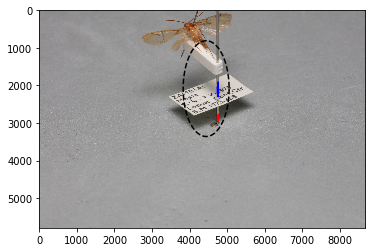

In [46]:
img = io.imread(pth)
img_bw = io.imread(pth,as_gray=True)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

filtered_pin_contours, pin_k = filter_pin_contours(pin_contours,ellipse_info)

fig,ax = plt.subplots()
ax.imshow(img)

for u,p in enumerate(filtered_pin_contours):
    col = '-r'
    if u == pin_k:
        col = '-b'
    ax.plot(p[0],p[1],col)
    
ax.plot(xe,ye,'--k')    

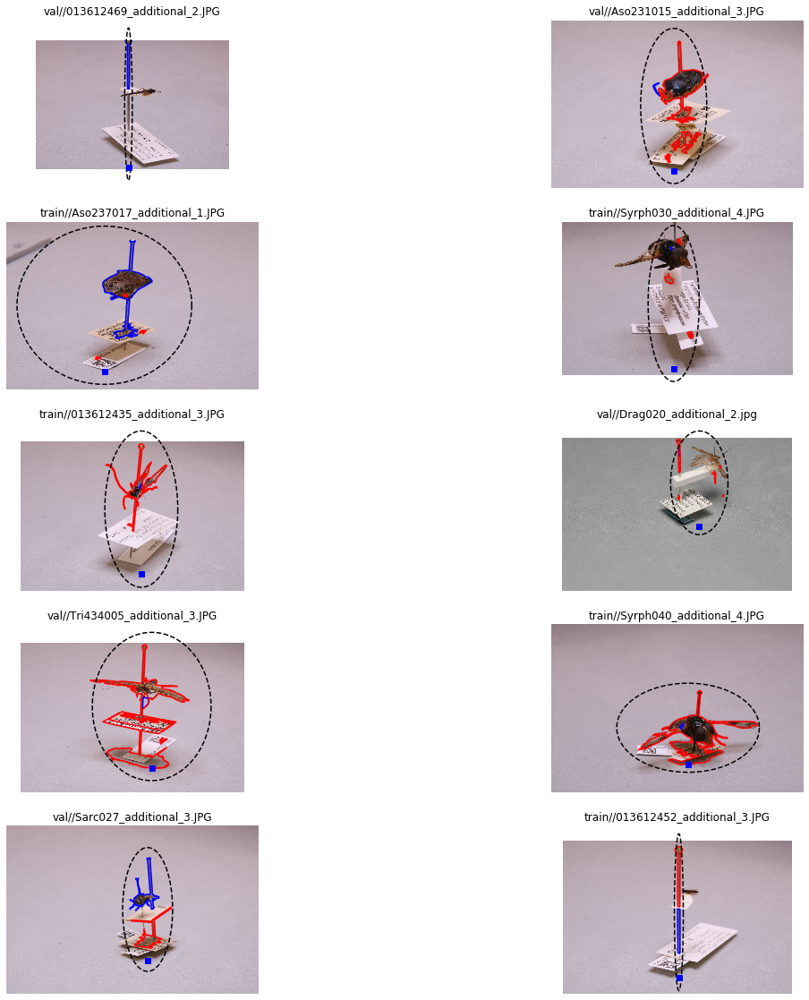

In [48]:
fig,ax = plt.subplots(5,2,figsize=(20,20))

j = 0

for u,filepath in enumerate(sample_filenames[:10]):
    i = u%5
    
    img = io.imread(filepath)
    img_bw = io.imread(filepath,as_gray=True)

    pin_contours, base_point =  find_pin_contours(img_bw,k=20)

    xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

    filtered_pin_contours, pin_k = filter_pin_contours(pin_contours,ellipse_info)

    ax[i,j].imshow(img)

    for u,p in enumerate(filtered_pin_contours):
        col = '-r'
        if u == pin_k:
            col = '-b'        
        ax[i,j].plot(p[0],p[1],col)

    ax[i,j].plot(xe,ye,'--k')    
   
    ax[i,j].plot(base_point[0],base_point[1],'bs')
    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:])
    
    if i == 4:
        j = j+1
    

### Pin Colour Tests

Tl;DR - Based on a region created by the possible _pin contours_, find the mode colour (RGB).

In [62]:
def modeValue(values, valuesOrder=[]):
    try:
        # Compute mode of list using the mode function from the statistics library.
        # This function can only output a mode if there is a unique mode.
        md = stats.mode(values)
    except:
        # Find multiple mode values.
        counts = [values.count(i) for i in np.unique(values)]
        modes = np.unique(values)[np.where(np.array(counts) == max(counts))[0]]
        # Now, we either choose the top mode based on some rank, or simply return all mode values:
        if len(valuesOrder) > 0:
            # Choose the mode value that has the lowest rank in the order (e.g. shortest distances)
            k = np.argmin([np.where(np.array(valuesOrder) == p)[0][0] for p in modes])
            md = modes[k]
        else:
            md = modes
    return md

In [65]:
tst = img[np.int_(filtered_pin_contours[0][0]),np.int_(filtered_pin_contours[0][0])]

In [73]:
tst_ = [str(p) for p in tst]
counts = [len(np.where(np.array(tst_) == u)[0]) for u in np.unique(tst_)]
np.argsort(counts)[-1]

In [82]:
counts = [len(np.where(np.array(tst_) == u)[0]) for u in np.unique(tst_)]

In [94]:
img2[:] = tst[np.argmax(counts)]

In [92]:
img2 = deepcopy(img)

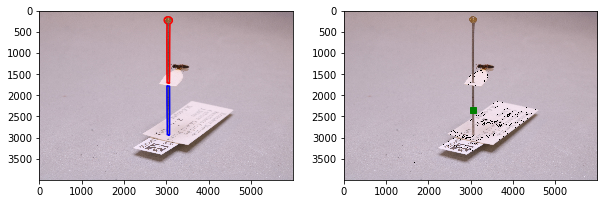

In [117]:
fig,ax = plt.subplots(1,2,figsize=(10,4))
ax[0].imshow(img)
ax[1].imshow(img3)

for u,p in enumerate(filtered_pin_contours):
    col = '-r'
    if u == pin_k:
        col = '-b'        
    ax[0].plot(p[0],p[1],col)
    
ax[1].plot(3048,2356,'gs')

In [97]:
img3 = deepcopy(img)

In [107]:
img3[np.where(img3==tst[41])[0:2]] = [0,0,0]

In [118]:
point1 = (min(filtered_pin_contours[pin_k][0])+max(filtered_pin_contours[pin_k][0]))/2
point2 = (min(filtered_pin_contours[pin_k][1])+max(filtered_pin_contours[pin_k][1]))/2
img[point2,point1]

array([127, 106, 103], dtype=uint8)

In [29]:
img = io.imread(sample_filenames[15])
img_bw = io.imread(sample_filenames[15],as_gray=True)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

filtered_pin_contours, pin_k = filter_pin_contours(pin_contours,ellipse_info)


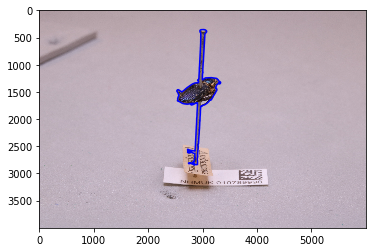

In [30]:
fig,ax = plt.subplots()
ax.imshow(img)
ax.plot(filtered_pin_contours[pin_k][0],filtered_pin_contours[pin_k][1],'-b')

In [31]:
x = filtered_pin_contours[pin_k][0]
y = filtered_pin_contours[pin_k][1]
a3 = np.array([np.array([x,y]).T], dtype=np.int32 )
cv2.fillPoly( img, a3, (255,0,0) )
plt.imshow(img)

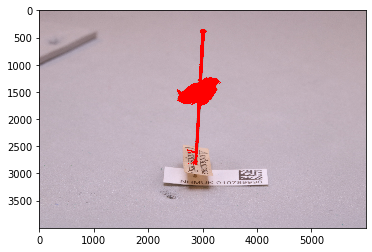

In [32]:
a3 = np.array([np.array([x,y]).T], dtype=np.int32 )
cv2.fillPoly( img, a3, (255,0,0) )
plt.imshow(img)

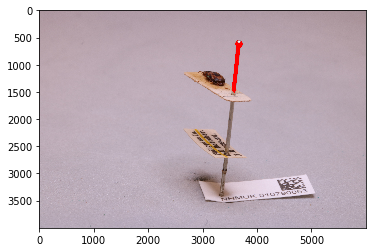

In [25]:
plt.imshow(img)

In [34]:
img_orig = io.imread(sample_filenames[15])

In [35]:
region_cols = img_orig[np.where(img==[255,0,0])[0:2]]

In [ ]:
tst_ = [str(p) for p in region_cols]
counts = [len(np.where(np.array(tst_) == u)[0]) for u in np.unique(tst_)]
np.argsort(counts)[-1]

In [38]:
bla = len(np.unique(tst_))

In [41]:
stats.mode(tst_)

'[112  89  81]'

In [49]:
new_img = deepcopy(img_orig)
new_img[np.where(img_orig == [112,89,81])[0:2]] = [255,0,0]

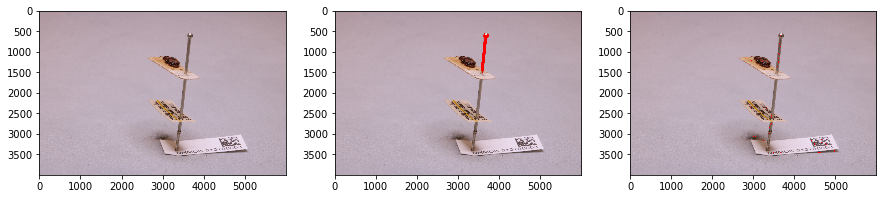

In [50]:
fig,ax = plt.subplots(1,3,figsize=(15,4))
ax[0].imshow(img_orig)
ax[1].imshow(img)
ax[2].imshow(new_img)

In [11]:
def myround(pixels, base=5):
    rounded_colours = []
    for x in pixels:
        rounded_colours.append(int(base * round(float(x)/base)))
    return rounded_colours

In [30]:
green_img = np.apply_along_axis(myround, -1, img)

In [52]:
bla_img = deepcopy(img_orig)
bla_img[np.where(green_img==[125, 105, 100])[0:2]] = [255,0,0]

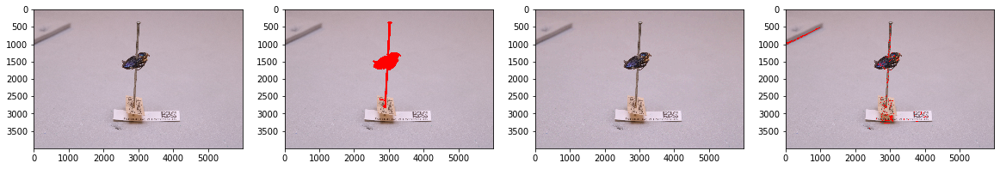

In [54]:
fig,ax = plt.subplots(1,4,figsize=(20,4))
ax[0].imshow(img_orig)
ax[1].imshow(img)
ax[2].imshow(green_img)
ax[3].imshow(bla_img)

In [36]:
tst_2 = [str(myround(p)) for p in region_cols]

### Boundary Fill & Flood Fill Tests

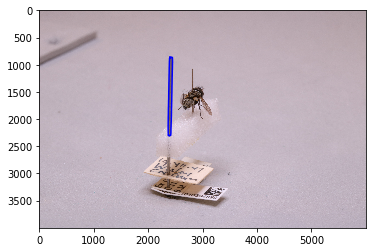

In [23]:
img = io.imread(sample_filenames[2])
img_bw = io.imread(sample_filenames[2],as_gray=True)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

filtered_pin_contours, pin_k = filter_pin_contours(pin_contours,ellipse_info)

fig,ax = plt.subplots()
ax.imshow(img)

ax.plot(filtered_pin_contours[pin_k][0],filtered_pin_contours[pin_k][1],'-b')

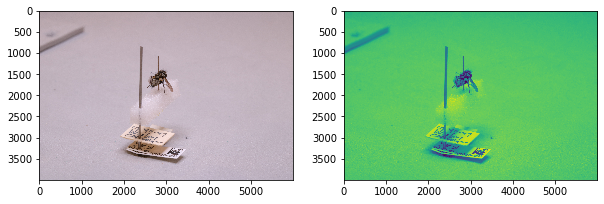

In [24]:
fig,ax = plt.subplots(1,2,figsize=(10,4))
ax[0].imshow(img)
ax[1].imshow(img_bw)

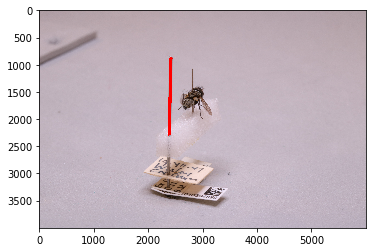

In [25]:
filled_img = deepcopy(img)
x = filtered_pin_contours[pin_k][0]
y = filtered_pin_contours[pin_k][1]
a3 = np.array([np.array([x,y]).T], dtype=np.int32 )
cv2.fillPoly( filled_img, a3, (255,0,0) )
plt.imshow(filled_img)

In [179]:
pth = 'Data//Images//train//Tri434002_additional_3.JPG'

### Approximating Pin (X) Range

Tl;DR -- Draw a line based on the approximate location of the pin on the $x$ axis. This is based on the highest concentration of mode pin colour.

In [26]:
region_cols = img[np.where(filled_img==[255,0,0])[0:2]]
tst_2 = [str(myround(p)) for p in region_cols]

a = stats.mode(tst_2)
bla = re.findall('\d+',a)
mode_col = np.int_(bla)

In [68]:
bla_img2 = deepcopy(img)
bla_img2[np.where(green_img==mode_col)[0:2]] = np.int_(bla)

In [35]:
bla_img = deepcopy(img)

bla = re.findall('\d+',a)
    bla_img = convert_img(img,np.int_(bla))

bla_img[np.where(green_img==[125, 105, 100])[0:2]] = [255,0,0]

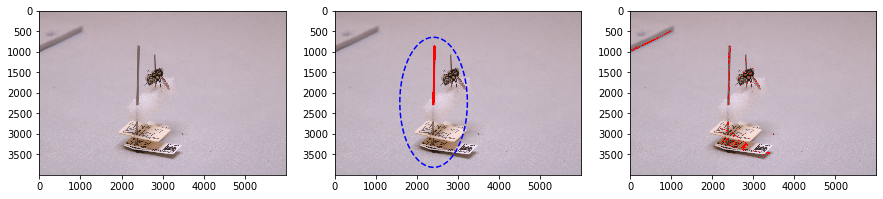

In [40]:
fig,ax = plt.subplots(1,3,figsize=(15,4))
ax[0].imshow(img)
ax[1].imshow(filled_img)
ax[2].imshow(bla_img)

ax[1].plot(ellipse[0],ellipse[1],'--b')

In [39]:
filt_contours, _,_,ellipse, boundary = approximate_region(sample_filenames[2])

In [48]:
count = [len(np.where(bla_img[:,i]==[255,0,0])[0]) for i in range(0,np.shape(bla_img)[1])]

<BarContainer object of 6000 artists>

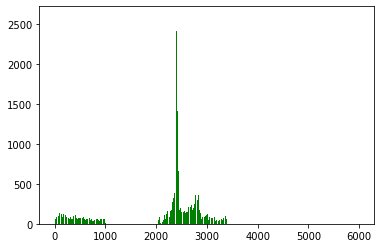

In [51]:
fig,ax = plt.subplots()
ax.bar(list(range(0,np.shape(bla_img)[1])), count, color='green')

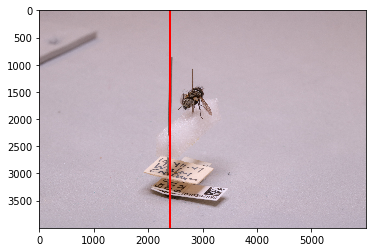

In [56]:
fig,ax = plt.subplots()
ax.imshow(img)
ax.plot([2403,2403],[0,np.shape(img)[0]-1],'-r',linewidth=2)

In [177]:
def pin_line(pth):
    img = io.imread(pth)
    img_bw = io.imread(pth,as_gray=True)

    pin_contours, base_point =  find_pin_contours(img_bw,k=20)

    xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

    filtered_pin_contours, pin_k = filter_pin_contours(pin_contours,ellipse_info)
    
    filled_img = deepcopy(img)
    x = filtered_pin_contours[pin_k][0]
    y = filtered_pin_contours[pin_k][1]
    a3 = np.array([np.array([x,y]).T], dtype=np.int32 )
    cv2.fillPoly( filled_img, a3, (255,0,0) )

    region_cols = img[np.where(filled_img==[255,0,0])[0:2]]
#     tst_2 = [str(myround(p)) for p in region_cols]
    
    b = [np.average(img[np.shape(img)[0]-10:,0:10,0]),np.average(img[np.shape(img)[0]-10:,0:10,1]),np.average(img[np.shape(img)[0]-10:,0:10,2])]
    tst_2 = [str(myround(p)) for p in region_cols if myround(p)!=myround(b)]
    
    a = stats.mode(tst_2)
    bla = re.findall('\d+',a)
    bla_img = convert_img(img,np.int_(bla))
    
    count = [len(np.where(bla_img[:,i]==[255,0,0])[0]) for i in range(0,np.shape(bla_img)[1])]
    
    p = np.argmax(count)
    
    return img, [p,np.shape(img)[0]-1]

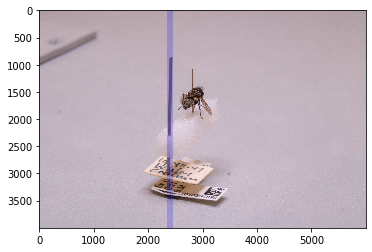

In [140]:
fig,ax = plt.subplots()
ax.imshow(img)
ax.fill([v[0]-50,v[0]+50, v[0]+50, v[0]-50,v[0]-50],[0,0,v[1],v[1],0],'b',alpha=0.2)

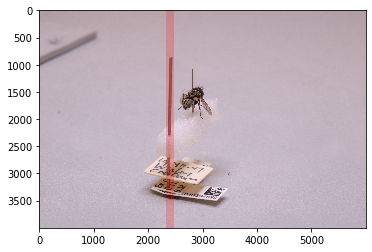

In [142]:
img,v = pin_line(sample_filenames[2])
fig,ax = plt.subplots()
ax.imshow(img)
ax.plot([v[0],v[0]],[0,v[1]],'-r',linewidth=8,alpha=0.2)

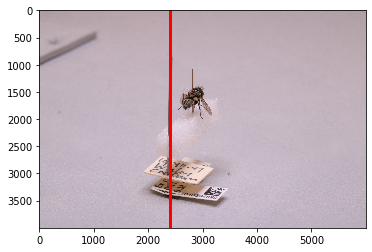

In [125]:
img,v = pin_line(sample_filenames[2])
fig,ax = plt.subplots()
ax.imshow(img)
ax.plot([v[0],v[0]],[0,v[1]],'-r',linewidth=3)

In [76]:
tst_img = deepcopy(img)

a,b,_ = np.shape(img)

for i in range(0,a):
    for j in range(0,b):
        tst_img[i,j] = myround(img[i,j])

In [78]:
md =  stats.mode(tst_2)
bla = re.findall('\d+',md)

In [122]:
def convert_img(img,bla,new_col=[255,0,0]):
    bla1 = img[:,:,0]
    bla2 = img[:,:,1]
    bla3 = img[:,:,2]

    v = np.where(((bla1>=bla[0]-5) & (bla1<=bla[0]+5)) &
                 ((bla2>=bla[1]-5) & (bla2<=bla[1]+5)) & 
                 ((bla3>=bla[2]-5) & (bla3<=bla[2]+5)))


    img2 = deepcopy(img)
    img2[v] = new_col
    return img2

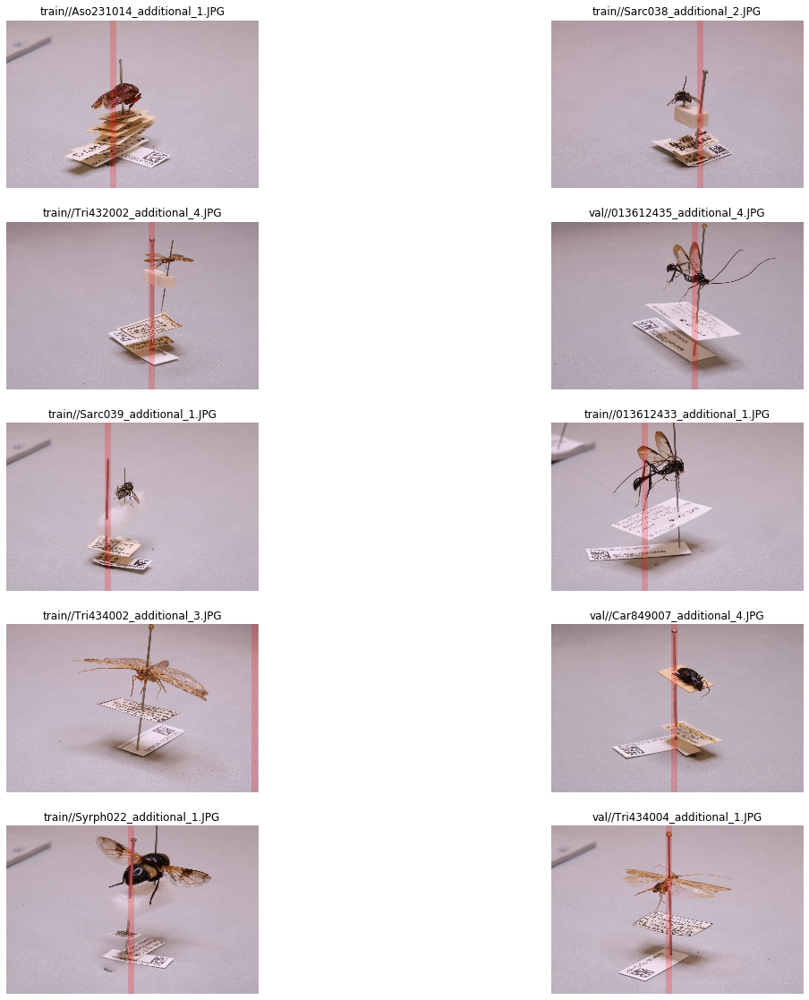

In [143]:
fig,ax = plt.subplots(5,2,figsize=(20,20))

j = 0

for u,filepath in enumerate(sample_filenames[:10]):
    i = u%5
    
    img,v = pin_line(filepath)
    
    ax[i,j].imshow(img)
    ax[i,j].plot([v[0],v[0]],[0,v[1]],'-r',linewidth=7,alpha=0.2)

    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:])
    
    if i == 4:
        j = j+1
    

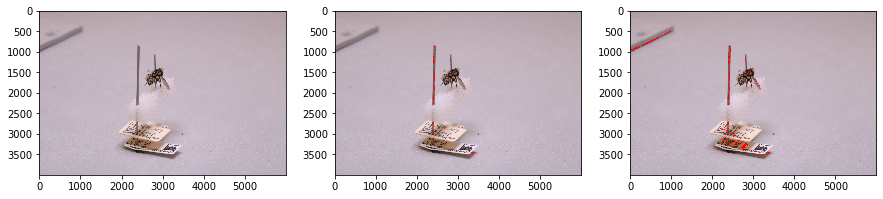

In [116]:
'train//Tri434002_additional_3.JPG'
fig,ax = plt.subplots(1,3,figsize=(15,4))
ax[0].imshow(img)
ax[1].imshow(img2)
ax[2].imshow(bla_img)



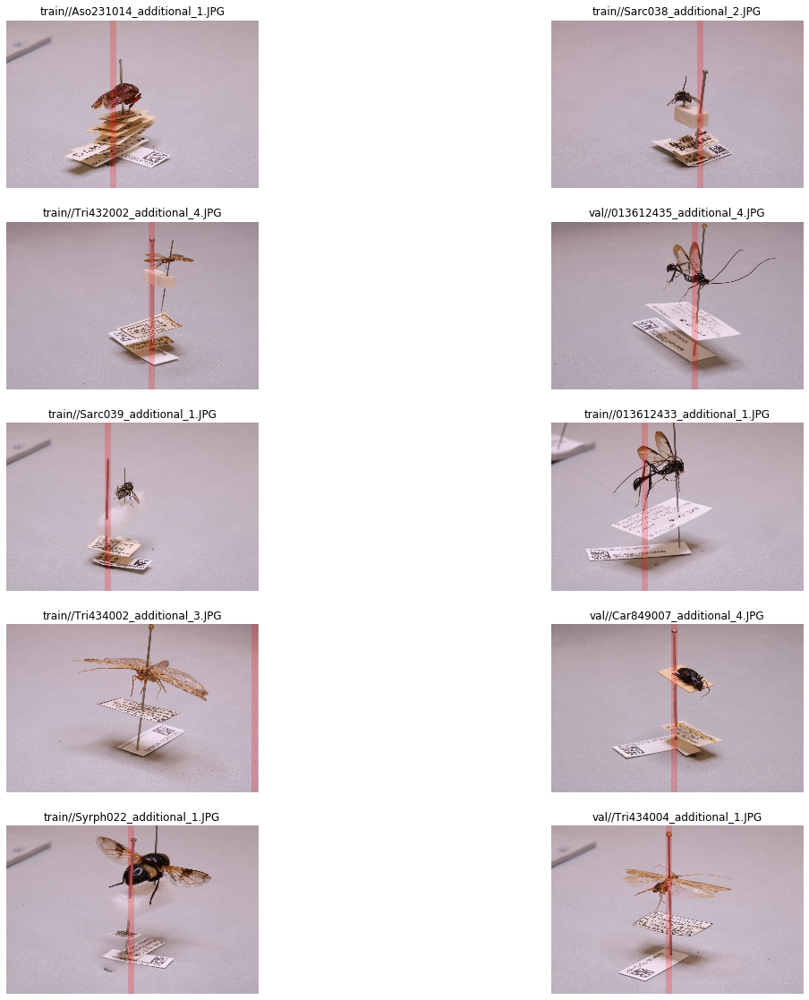

In [178]:
fig,ax = plt.subplots(5,2,figsize=(20,20))

j = 0

for u,filepath in enumerate(sample_filenames[:10]):
    i = u%5
    
    img,v = pin_line(filepath)
    
    ax[i,j].imshow(img)
    ax[i,j].plot([v[0],v[0]],[0,v[1]],'-r',linewidth=7,alpha=0.2)

    ax[i,j].axis('off')
    ax[i,j].set_title(filepath[14:])
    
    if i == 4:
        j = j+1
        
plt.savefig('pin_contour_line_range_test.pdf',dpi=600,bbox_inches='tight',pad_inches=0.35)
    

In [168]:
b = [np.average(img[np.shape(img)[0]-10:,0:10,0]),np.average(img[np.shape(img)[0]-10:,0:10,1]),np.average(img[np.shape(img)[0]-10:,0:10,2])]

In [174]:
b = [np.average(img[np.shape(img)[0]-10:,0:10,0]),np.average(img[np.shape(img)[0]-10:,0:10,1]),np.average(img[np.shape(img)[0]-10:,0:10,2])]
tst_2 = [str(myround(p)) for p in region_cols if myround(p)!=myround(b)]


### Filtering for Vertical Segments

Tl;DR - Pin contours aren't that great, thus we filter for points which lie on vertical segments. These points on the contour are assumed to be part of the pin.

In [7]:
pth = 'Data//Images//val//Drag018_additional_1.jpg'

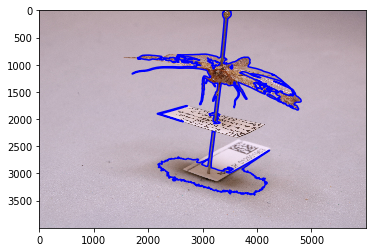

In [181]:
img = io.imread(pth)
img_bw = io.imread(pth,as_gray=True)

pin_contours, base_point =  find_pin_contours(img_bw,k=20)

xe, ye, ellipse_info = init_region_ellipse(pin_contours, base_point)

filtered_pin_contours, pin_k = filter_pin_contours(pin_contours,ellipse_info)

fig,ax = plt.subplots()
ax.imshow(img)
for xy in filtered_pin_contours:
    ax.plot(xy[0],xy[1],'-b')

C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in true_divide
  This is separate from the ipykernel pack

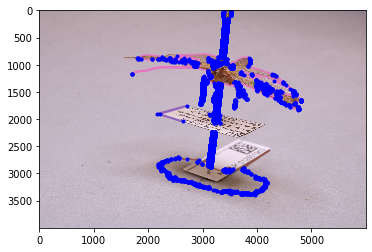

In [293]:
fig,ax = plt.subplots()
ax.imshow(img)
for xy in filtered_pin_contours:
    ax.plot(xy[0],xy[1])
    x_,y_ = find_vertical_segments(xy)
    ax.plot(x_,y_,'.b')

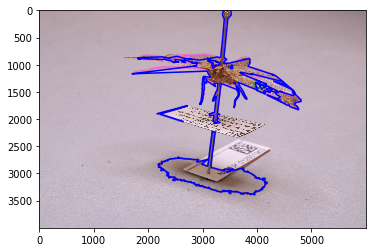

In [312]:
fig,ax = plt.subplots()
ax.imshow(img)
for xy in filtered_pin_contours:
    ax.plot(xy[0],xy[1])
    x_,y_ = find_vertical_segments(xy)
    ax.plot(x_,y_,'-b')

In [244]:
def get_curvature(x, y):

    # This function computes the curvature of a curve.

    dx = np.gradient(x)
    dy = np.gradient(y)

    d2x = np.gradient(dx)
    d2y = np.gradient(dy)

    cv = np.abs(dx * d2y - d2x * dy) / (((dx * dx) + (dy * dy)) ** 1.5)

    n = len(cv)

    for p, c in enumerate(cv):
        if np.isnan(c):
            cv[p] = np.inf

    return cv

In [246]:
np.where(c == np.inf)

(array([2092, 2350], dtype=int64),)

In [260]:
dx = np.gradient(x)
dy = np.gradient(y)
bla_ = (((dx * dx) + (dy * dy)) ** 1.5)

In [263]:
d2x = np.gradient(dx)
d2y = np.gradient(dy)

In [265]:
 cv = np.abs(dx * d2y - d2x * dy) / (((dx * dx) + (dy * dy)) ** 1.5)

C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [262]:
c = get_curvature(x,y)

C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


In [205]:
ub = 1

In [247]:
gr = np.where(c>0)[0]
le = np.where(c<=0)[0]

In [302]:
ble = np.nan_to_num(abs(np.gradient(y)/np.gradient(x)),posinf=100)


C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [298]:
def find_vertical_segments(xy):
    x,y = removeReps(np.round(xy[0]),np.round(xy[1]))
    #ble = np.nan_to_num(abs(np.gradient(y)/np.gradient(x)),posinf=100)
    x_ = np.array(x)[np.where(np.gradient(x)==0)[0]]
    y_ = np.array(y)[np.where(np.gradient(x)==0)[0]]
    return x_,y_

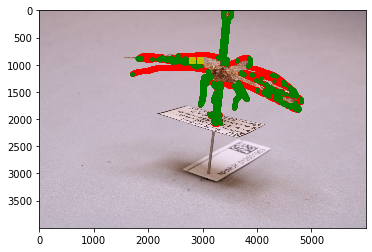

In [311]:
fig,ax = plt.subplots()
ax.imshow(img)
ax.plot(np.array(x)[np.where(ble<100)[0]],np.array(y)[np.where(ble<100)[0]],'.r')
ax.plot(np.array(x)[np.where(ble==100)[0]],np.array(y)[np.where(ble==100)[0]],'.g')

ax.plot(x[2092],y[2092],'ys')
ax.plot(x[2350],y[2350],'ys')


In [284]:
ble = np.nan_to_num(abs(np.gradient(y)/np.gradient(x)),posinf=100)

C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in true_divide
  """Entry point for launching an IPython kernel.
C:\Users\arian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


In [215]:
def removeReps(T, F):
    n = len(T)
    newT = []
    newF = []
    newT.append(T[0])
    newF.append(F[0])
    k = 0
    for i in range(1, n):
        if (T[i] != newT[k]) or (F[i] != newF[k]):
            newT.append(T[i])
            newF.append(F[i])
            k = k + 1
    return newT, newF

In [216]:
x,y = removeReps(np.round(xy[0]),np.round(xy[1]))

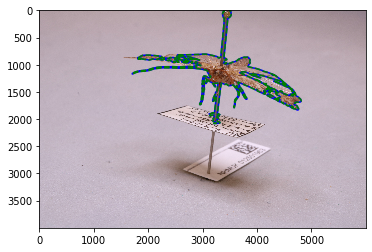

In [217]:
fig,ax = plt.subplots()
ax.imshow(img)
ax.plot(xy[0],xy[1],'-b')
ax.plot(x,y,'--g')

In [257]:
u = np.where(np.gradient(x)==0)[0]

In [258]:
p = np.where(np.gradient(y)==0)[0]

In [370]:
mu = np.where(ble==100)[0]

In [313]:
x_ = np.array(x)[np.where(ble==100)[0]]
y_ = np.array(y)[np.where(ble==100)[0]]

In [361]:
newvals = {}
k = 0
newvals[0] = [mu[0]]
for u in range(1,len(mu)):
    vals = newvals[k]
    if (mu[u]<=vals[-1]+100) or (abs(x[mu[u]]-x[vals[-1]])<50):
        vals.append(mu[u])
        newvals[k] = vals
    else:
        k = k+1
        newvals[k] = [mu[u]]

In [362]:
l = list(newvals.keys())[-1]

In [363]:
q = np.where(np.array([len(newvals[p]) for p in range(0,l)])>=10)[0]

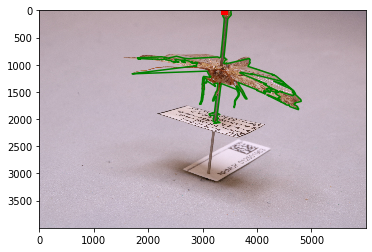

In [375]:
fig,ax = plt.subplots()
ax.imshow(img)


ax.plot(np.array(x)[mu],np.array(y)[mu],'-g')
ax.plot(x[mu[0]],y[mu[0]],'rs')

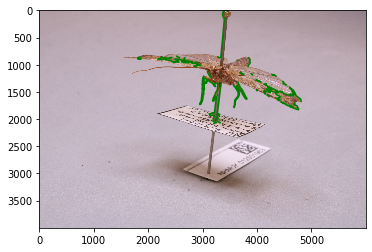

In [369]:
fig,ax = plt.subplots()
ax.imshow(img)

for v in range(0,l):
    inds = newvals[v]
    ax.plot(np.array(x)[inds],np.array(y)[inds],'-g')